In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import xarray as xr
import pandas as pd
import icechunk

from srm.analysis import BCSDRun, load_nasa_nex
from srm.bcsd_config import BCSDConfig, VariableConfig

from srm import catalog
from srm.plotting import (
    calculate_statistic_to_plot,
    get_4_subregions,
    locations,
    plot_4regions_comparisons,
    plot_comparisons,
    plot_timeseries,
    prep_datasets_for_seasonal_cycle_plotting,
    random_non_leap_year,
)
from srm.utils import convert_precip_units

# Get data

In [2]:
# TODO: make the training period an attr in the dataset
training_period = slice("1984-01-01", "2014-12-31")
testing_period = slice("2080-01-01", "2100-12-31")
variables = ["tas"]

### Raw data

In [3]:
gcm = "CESM2-WACCM"  # TODO - once dataset name is fixed this should update to CESM2
scenario = "historical"  # "SSP245" # #  # "G6-1.5K"
dataset_name = f"{gcm}-{scenario}-icechunk"
raw = catalog.get(dataset_name).to_xarray()[variables].isel(ensemble_member=2).sel(time=training_period)

In [4]:
gcm = "CESM2-WACCM"  # TODO - once dataset name is fixed this should update to CESM2
scenario = "SSP245"  # "SSP245" # #  # "G6-1.5K"
dataset_name = f"{gcm}-{scenario}-icechunk"
raw_fut = catalog.get(dataset_name).to_xarray()[variables].isel(ensemble_member=2).sel(time=testing_period)

### ERA5

In [5]:
era5 = catalog.get("ERA5").to_xarray()
era5 = era5[variables].sel(time=training_period)

### Downscaled data

In [13]:
vc = VariableConfig.for_variable("tas").model_copy(update={"do_windowing": True})
bcsd_config = BCSDConfig(
    gcm="CESM2-WACCM",
    variable="tas",
    ensemble_member="r3i1p1f1",
    scenario="ssp245",
    predict_period_start=2015,
    predict_period_end=2100,
    variable_config=vc,
    version='v0.6.0run2',
    mapping_type='nonparametric_hybrid',
    output_dir="s3://carbonplan-scratch/srm/outputs/"
)
r = BCSDRun(bcsd_config)

In [14]:
ds1_tas = r.historical.sel(time=training_period)
ds1_tas_fut = r.scenario.sel(time=testing_period)

### NASA NEX

In [16]:
ds2_tas = load_nasa_nex(dataset="historical").isel(ensemble_member=0).sel(time=training_period)

/opt/coiled/env/lib/python3.13/site-packages/zarr/codecs/numcodecs/_codecs.py:141: ZarrUserWarning: Numcodecs codecs are not in the Zarr version 3 specification and may not be supported by other zarr implementations.
  super().__init__(**codec_config)


In [17]:
ds2_tas_fut = load_nasa_nex(dataset="ssp245").isel(ensemble_member=0).sel(time=testing_period)

/opt/coiled/env/lib/python3.13/site-packages/zarr/codecs/numcodecs/_codecs.py:141: ZarrUserWarning: Numcodecs codecs are not in the Zarr version 3 specification and may not be supported by other zarr implementations.
  super().__init__(**codec_config)


# Compare NASA NEX Historical

## Global comparisons

### Mean temperature

In [25]:
raw_tas_toplot, era5_tas_toplot, ds1_tas_toplot, ds2_tas_toplot = calculate_statistic_to_plot(
    ds_list=[raw,era5,ds1_tas,ds2_tas],
    stat="mean",
    variable="tas",
)

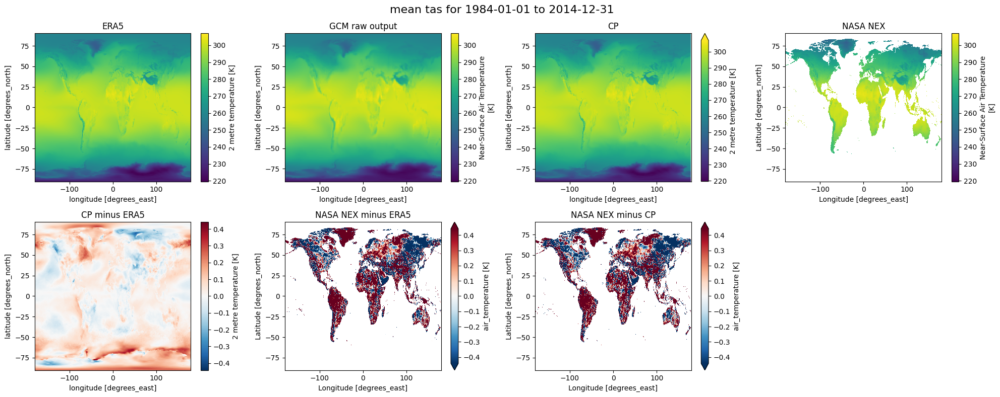

In [24]:
plot_comparisons(
    era5_tas_toplot,
    raw_tas_toplot,
    ds1_tas_toplot,
    ds1_name="CP",
    ds2=ds2_tas_toplot,
    ds2_name="NASA NEX",
    title=f"mean tas for {training_period.start} to {training_period.stop}",
)

### Hottest day

In [41]:
raw_hottest_day_toplot, era5_hottest_day_toplot, ds1_hottest_day_toplot, ds2_hottest_day_toplot = (
    calculate_statistic_to_plot(
        ds_list=[raw, era5,ds1_tas,ds2_tas],
        stat="hottest_day",
        variable="tas",
    )
)

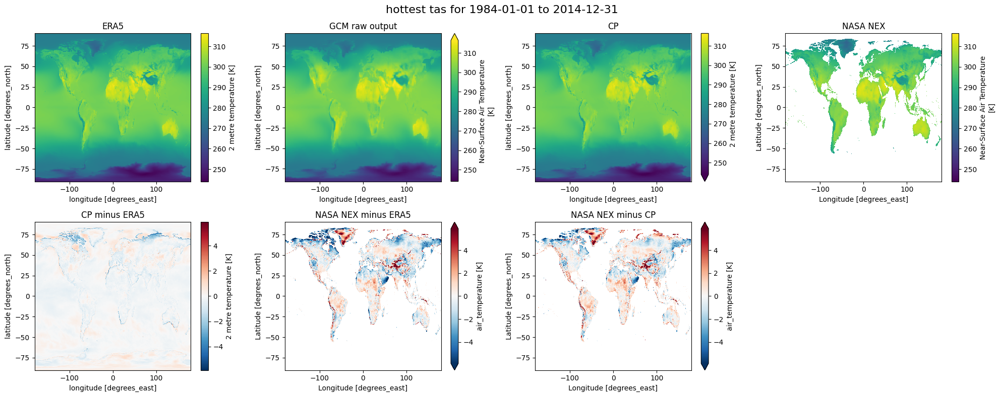

In [26]:
plot_comparisons(
    era5_hottest_day_toplot,
    raw_hottest_day_toplot,
    ds1_hottest_day_toplot,
    ds2=ds2_hottest_day_toplot,
    ds1_name="CP",
    ds2_name="NASA NEX",
    title=f"hottest tas for {training_period.start} to {training_period.stop}",
)

### Days over 30C

In [64]:
raw_over30C_toplot, era5_over30C_toplot, ds1_over30C_toplot, ds2_over30C_toplot = (
    calculate_statistic_to_plot(ds_list=[raw, 
                                         era5, 
                                         ds1_tas,
                                         ds2_tas],
                                stat="days_over_30C", 
                                variable="tas")
)

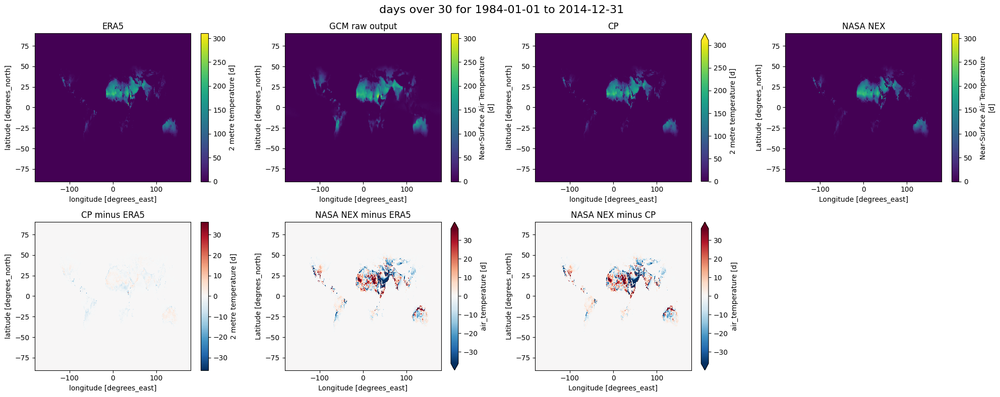

In [65]:
plot_comparisons(
    era5_over30C_toplot,
    raw_over30C_toplot,
    ds1_over30C_toplot,
    ds2=ds2_over30C_toplot,
    ds1_name="CP",
    ds2_name="NASA NEX",
    title=f"days over 30 for {training_period.start} to {training_period.stop}",
)

## Regional comparisons

In [78]:
raw_sub = get_4_subregions(raw)
era5_sub = get_4_subregions(era5)
ds1_sub = get_4_subregions(ds1_tas)
ds2_sub = get_4_subregions(ds2_tas)

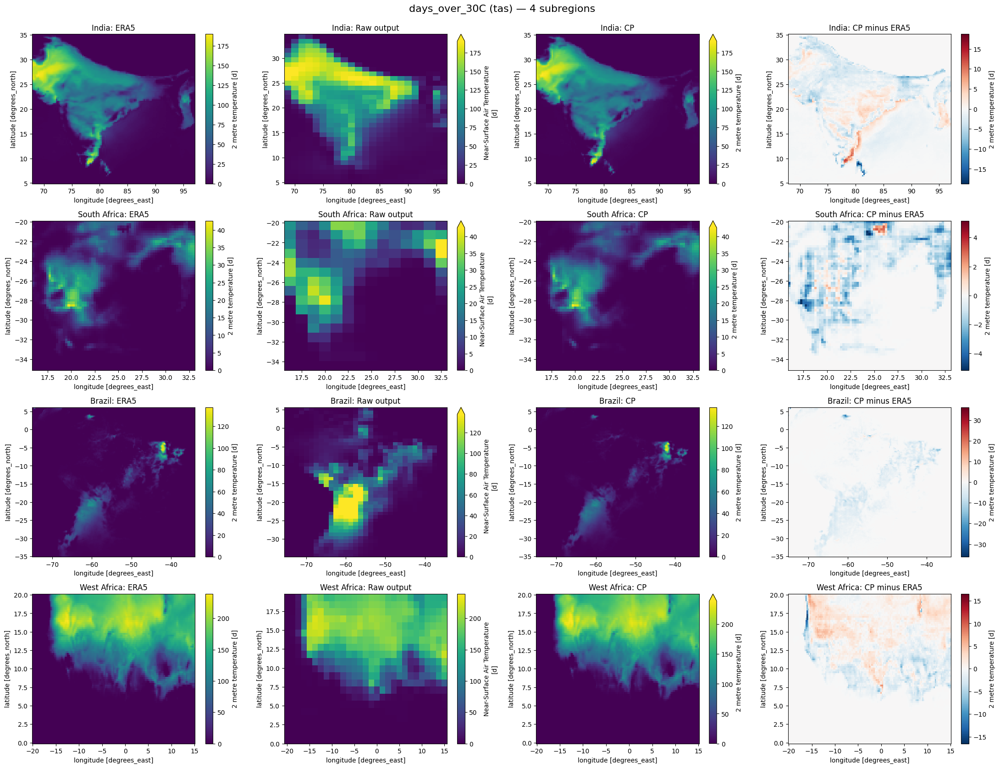

In [94]:
fig = plot_4regions_comparisons(
    raw=raw, era5=era5, ds1=ds1_tas, stat="days_over_30C", variable="tas", ds1_title="CP",
    #ds2_title="NASA NEX",
)
plt.show()

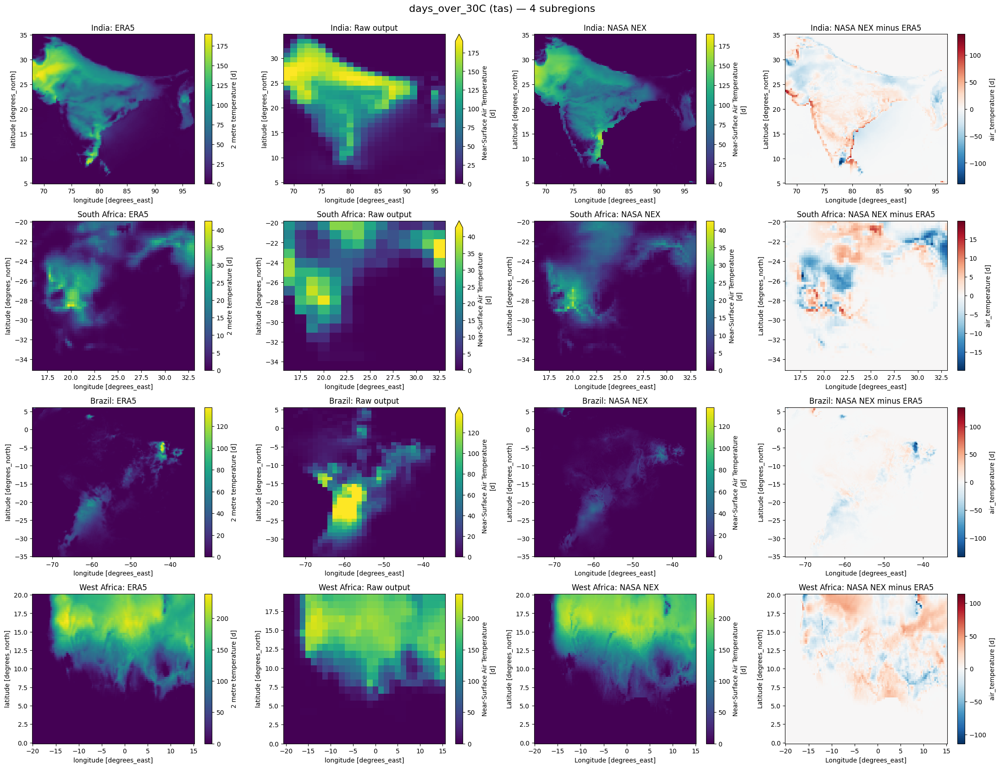

In [95]:
fig = plot_4regions_comparisons(
    raw=raw, era5=era5, ds1=ds2_tas, stat="days_over_30C", variable="tas", ds1_title="NASA NEX",
    #ds2_title="NASA NEX",
)
plt.show()

In [ ]:
fig = plot_4regions_comparisons(
    raw=raw, era5=era5, ds1=ds1_tas, stat="mean", variable="tas", ds1_title="CP",
)
plt.show()

In [ ]:
fig = plot_4regions_comparisons(
    raw=raw, era5=era5, ds1=ds2_tas, stat="mean", variable="tas", ds1_title="NASA NEX",
)
plt.show()

In [ ]:
fig = plot_4regions_comparisons(
    raw=raw, era5=era5, ds1=ds2_tas, stat="hottest_day", variable="tas", ds1_title="CP",
)
plt.show()

In [ ]:
# temi TODO: write a description here for why we're doing this kind of analysis

## Point-level comparisons

In [29]:
ds1 = ds1_tas.sel(time=training_period)
ds2 = ds2_tas.sel(time=training_period)
era5 = era5.sel(time=training_period)
raw = raw.sel(time=training_period)

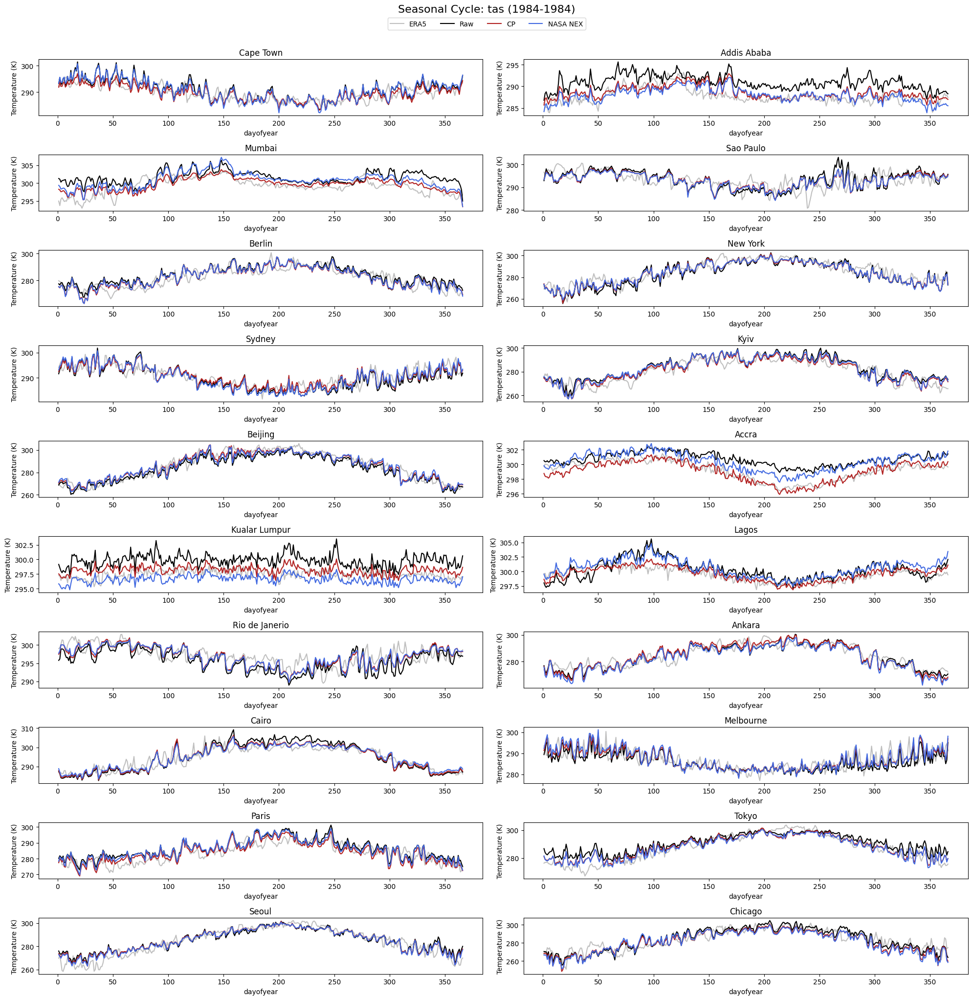

In [30]:
# temi TODO: add three more cells in this notebook, repeating these seasonal cycle plots for tasmax, tasmin, and tas
variable = "tas"
time_slice = slice("1984", "1984")

fig, axarr_shape = plt.subplots(nrows=10, ncols=2, figsize=(20, 20))
axarr = axarr_shape.flatten()
for i, (location, (lat, lon)) in enumerate(locations.items()):
    era5_toplot, raw_toplot, ds1_toplot, ds2_toplot = prep_datasets_for_seasonal_cycle_plotting(
        era5, raw, ds1, time_slice, lat, lon, variable, ds2=ds2
    )

    plot_timeseries(axarr[i], era5_toplot, raw_toplot, ds1_toplot, location, ds2_toplot)
    axarr[i].set_title(location)
    axarr[i].set_ylabel("Temperature (K)")

fig.suptitle(
    f"Seasonal Cycle: {variable} ({time_slice.start}-{time_slice.stop})", fontsize=16, y=1.02
)
fig.legend(["ERA5", "Raw", "CP", "NASA NEX"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()
# temi TODO: add a single legend applying to all of the panels of plots, above the figure
# temi TODO: add a title at the top of this figure (as part of the function) describing the variable and time period
# temi TODO: fix ylabels to have units

In [31]:
# Make a figure with all of the timeseries for all of the locations for the same time slice
# Repeat for a randomly selected year - for ease of calendar use only choose non-leap year calendars

In [32]:
ds_list = [era5, raw, ds1, ds2]

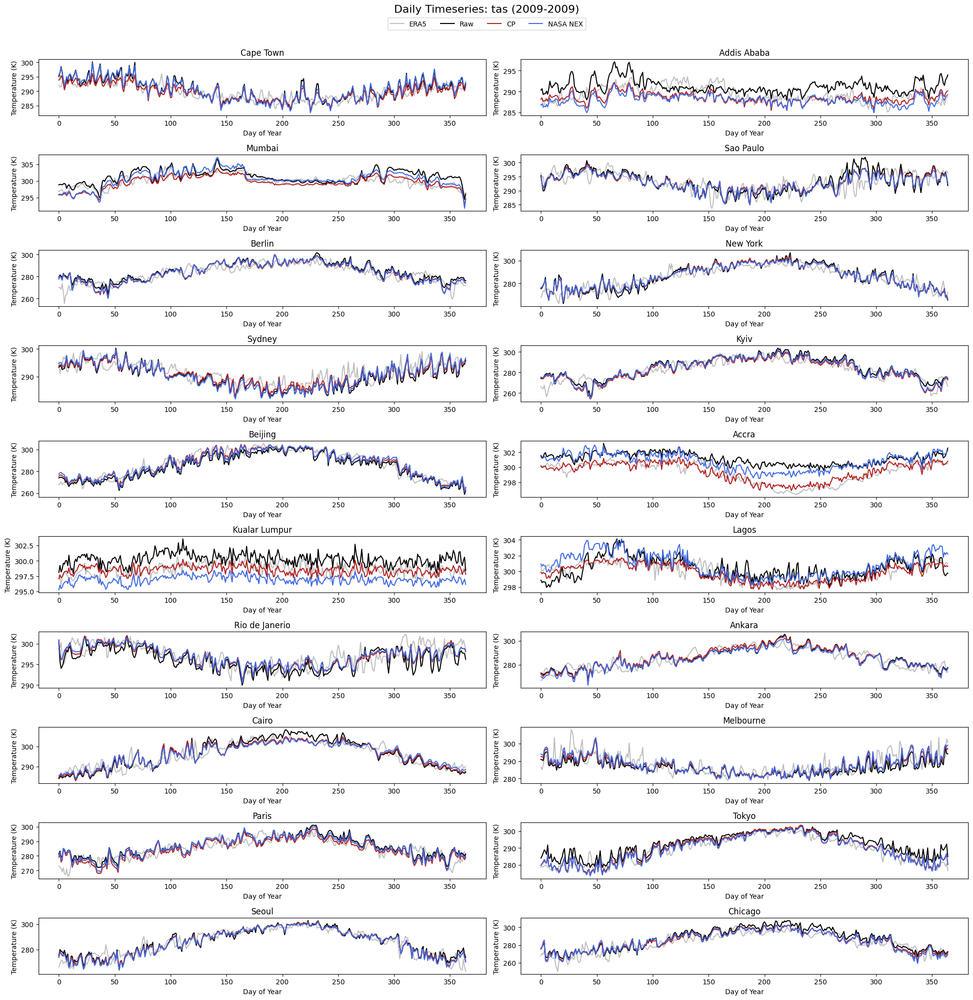

In [33]:
variable = "tas"
random_year = random_non_leap_year()
time_slice = slice(str(random_year), str(random_year))

fig, axarr_shape = plt.subplots(nrows=10, ncols=2, figsize=(20, 20))
axarr = axarr_shape.flatten()

for i, (location, (lat, lon)) in enumerate(locations.items()):
    # First select time, THEN select point with method='nearest'
    era5_sub = era5.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    raw_sub = raw.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds1_sub = ds1.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds2_sub = ds2.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")

    # Plot using .values to avoid datetime issues
    axarr[i].plot(era5_sub[variable].values, color="grey", alpha=0.5)
    axarr[i].plot(raw_sub[variable].values, color="k")
    axarr[i].plot(ds1_sub[variable].values, color="firebrick")
    axarr[i].plot(ds2_sub[variable].values, color="royalblue")

    axarr[i].set_title(location)
    axarr[i].set_ylabel("Temperature (K)")
    axarr[i].set_xlabel("Day of Year")

fig.suptitle(
    f"Daily Timeseries: {variable} ({time_slice.start}-{time_slice.stop})", fontsize=16, y=1.02
)
fig.legend(["ERA5", "Raw", "CP", "NASA NEX"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()
plt.show()

In [ ]:
# A PDF shows how often different rainfall amounts occur, helping to see typical values and variability. A CDF shows the fraction of days with rainfall below a given amount, making it easier to understand how often heavy or extreme rainfall events occur. These plots show that raw GCM output tends to underestimate extreme rainfall events while overestimating the frequency of low rainfall days, a common bias known as the drizzle bias.

In [67]:
# temi TODO: repeat the PDF figures (and update/extend the `plot_pdf` function as needed) for tasmax, tasmin, tas

A PDF shows how often different rainfall amounts occur, helping to see typical values and variability. A CDF shows the fraction of days with rainfall below a given amount, making it easier to understand how often heavy or extreme rainfall events occur. These plots show that raw GCM output tends to underestimate extreme rainfall events while overestimating the frequency of low rainfall days, a common bias known as the drizzle bias.

# Compare NASA NEX Future

### Mean temperature

In [31]:
ds1_tas_toplot_fut, ds2_tas_toplot_fut, raw_tas_toplot_fut = calculate_statistic_to_plot(
    ds_list=[ds1_tas_fut,ds2_tas_fut, raw_fut],
    stat="mean",
    variable="tas"
)

diff1=(ds1_tas_toplot_fut-ds1_tas_toplot)
diff2=(ds2_tas_toplot_fut-ds2_tas_toplot)
diff_raw=(raw_tas_toplot_fut-raw_tas_toplot)

diff_raw_fine = diff_raw.interp(
    lat=diff1.lat,
    lon=diff1.lon,
    method="linear"  # or "nearest", "cubic"
)

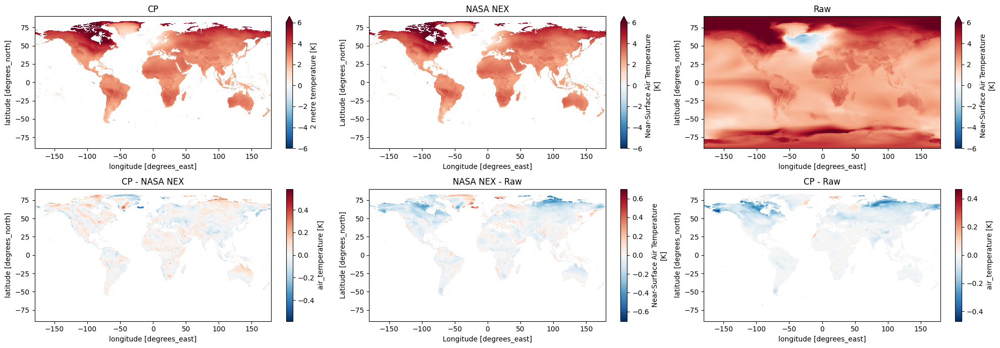

In [85]:
plt.figure(figsize=(20,7))
plt.subplot(2,3,1)
diff1.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title('CP')

plt.subplot(2,3,2)
diff2.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title('NASA NEX')

plt.subplot(2,3,3)
diff_raw.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title('Raw')

plt.subplot(2,3,4)
(diff1-diff2).plot()
plt.title('CP - NASA NEX')
plt.tight_layout()

plt.subplot(2,3,5)
(diff2-diff_raw_fine).plot()
plt.title('NASA NEX - Raw')
plt.tight_layout()

plt.subplot(2,3,6)
(diff1-diff_raw_fine).plot()
plt.title('CP - Raw')
plt.tight_layout()

### Hottest day

In [ ]:
ds1_hottest_day_toplot_fut, ds2_hottest_day_toplot_fut, raw_hottest_day_toplot_fut = calculate_statistic_to_plot(
    ds_list=[ds1_tas_fut,ds2_tas_fut, raw_fut],
    stat="hottest_day",
    variable="tas",
)

diff1=(ds1_hottest_day_toplot_fut-ds1_hottest_day_toplot)
diff2=(ds2_hottest_day_toplot_fut-ds2_hottest_day_toplot)
diff_raw=(raw_hottest_day_toplot_fut-raw_hottest_day_toplot)

diff_raw_fine = diff_raw.interp(
    lat=diff1.lat,
    lon=diff1.lon,
    method="linear"  # or "nearest", "cubic"
)

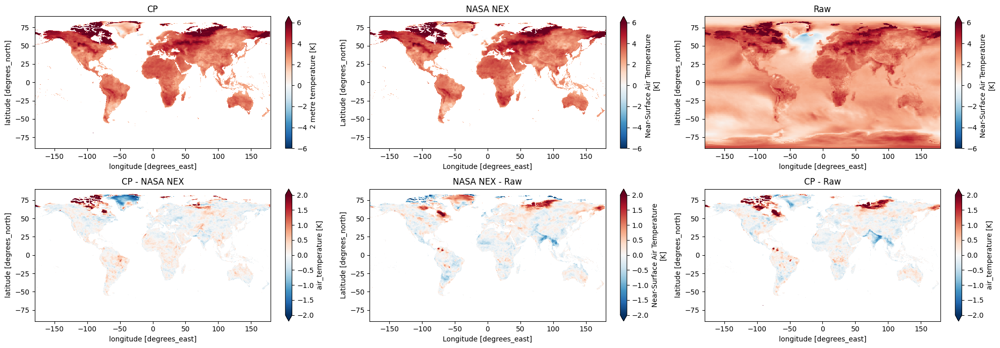

In [87]:
plt.figure(figsize=(20,7))
plt.subplot(2,3,1)
diff1.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title('CP')

plt.subplot(2,3,2)
diff2.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title('NASA NEX')

plt.subplot(2,3,3)
diff_raw.plot(vmax=6, vmin=-6, cmap=plt.cm.RdBu_r)
plt.title('Raw')

plt.subplot(2,3,4)
(diff1-diff2).plot(vmax=2, vmin=-2, cmap=plt.cm.RdBu_r)
plt.title('CP - NASA NEX')
plt.tight_layout()

plt.subplot(2,3,5)
(diff2-diff_raw_fine).plot(vmax=2, vmin=-2, cmap=plt.cm.RdBu_r)
plt.title('NASA NEX - Raw')

plt.subplot(2,3,6)
(diff1-diff_raw_fine).plot(vmax=2, vmin=-2, cmap=plt.cm.RdBu_r)
plt.title('CP - Raw')
plt.tight_layout()

### Days over 30C

In [67]:
ds1_over30C_toplot_fut, ds2_over30C_toplot_fut, raw_over30C_toplot_fut = calculate_statistic_to_plot(
    ds_list=[ds1_tas_fut,ds2_tas_fut, raw_fut],
    stat="days_over_30C",
    variable="tas",
)

diff1=(ds1_over30C_toplot_fut-ds1_over30C_toplot)
diff2=(ds2_over30C_toplot_fut-ds2_over30C_toplot)
diff_raw=(raw_over30C_toplot_fut-raw_over30C_toplot)

diff_raw_fine = diff_raw.interp(
    lat=diff1.lat,
    lon=diff1.lon,
    method="linear"  # or "nearest", "cubic"
)

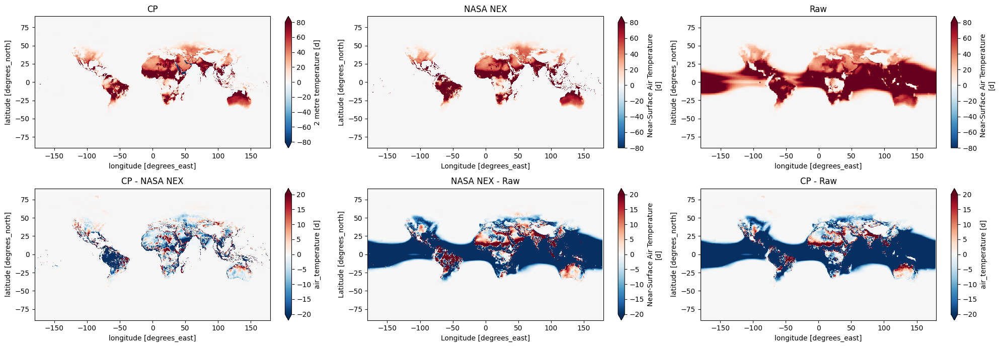

In [89]:
plt.figure(figsize=(20,7))
plt.subplot(2,3,1)
diff1.plot(vmax=80, vmin=-80, cmap=plt.cm.RdBu_r)
plt.title('CP')

plt.subplot(2,3,2)
diff2.plot(vmax=80, vmin=-80, cmap=plt.cm.RdBu_r)
plt.title('NASA NEX')

plt.subplot(2,3,3)
diff_raw.plot(vmax=80, vmin=-80, cmap=plt.cm.RdBu_r)
plt.title('Raw')

plt.subplot(2,3,4)
(diff1-diff2).plot(vmax=20, vmin=-20, cmap=plt.cm.RdBu_r)
plt.title('CP - NASA NEX')
plt.tight_layout()

plt.subplot(2,3,5)
(diff2-diff_raw_fine).plot(vmax=20, vmin=-20, cmap=plt.cm.RdBu_r)
plt.title('NASA NEX - Raw')

plt.subplot(2,3,6)
(diff1-diff_raw_fine).plot(vmax=20, vmin=-20, cmap=plt.cm.RdBu_r)
plt.title('CP - Raw')
plt.tight_layout()

## Point-level comparison

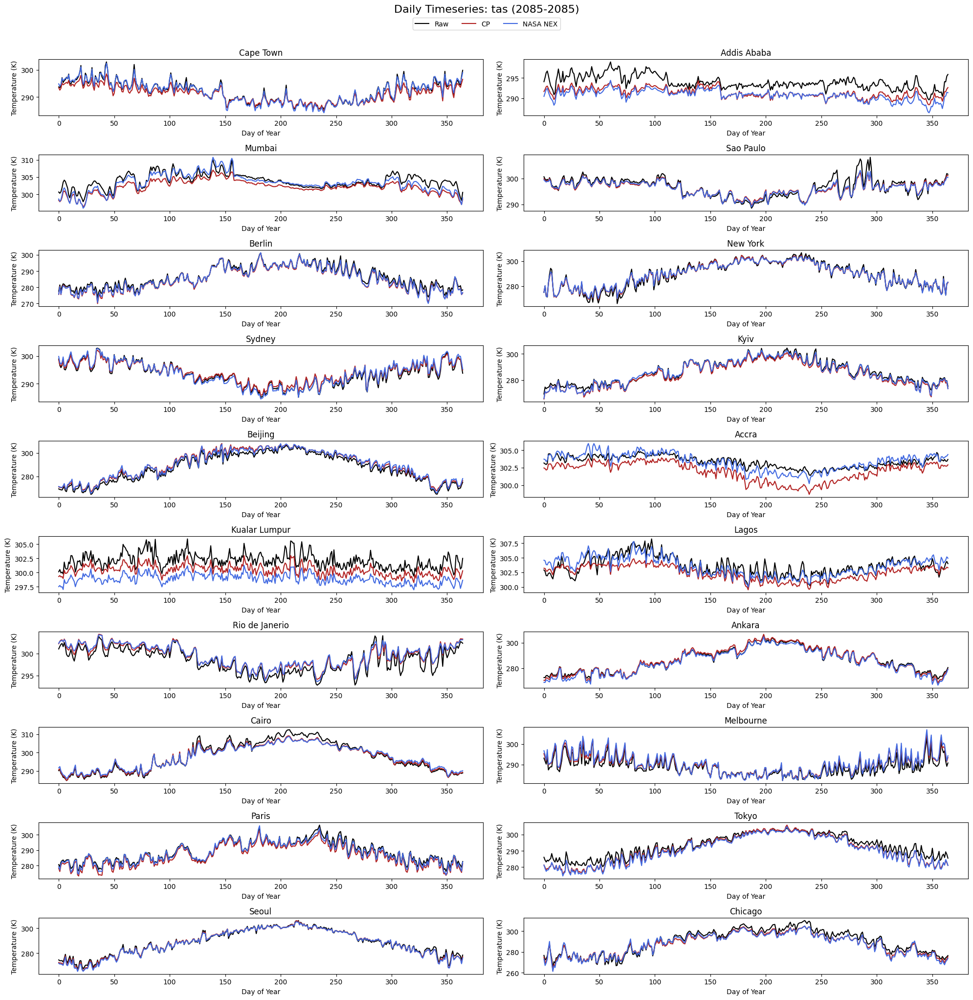

In [69]:
variable = "tas"
time_slice = slice(str(2085), str(2085))

fig, axarr_shape = plt.subplots(nrows=10, ncols=2, figsize=(20, 20))
axarr = axarr_shape.flatten()

for i, (location, (lat, lon)) in enumerate(locations.items()):
    # First select time, THEN select point with method='nearest'
    raw_sub = raw_fut.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds1_sub = ds1_tas_fut.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")
    ds2_sub = ds2_tas_fut.sel(time=time_slice).sel(lat=lat, lon=lon, method="nearest")

    # Plot using .values to avoid datetime issues
    axarr[i].plot(raw_sub[variable].values, color="k")
    axarr[i].plot(ds1_sub[variable].values, color="firebrick")
    axarr[i].plot(ds2_sub[variable].values, color="royalblue")

    axarr[i].set_title(location)
    axarr[i].set_ylabel("Temperature (K)")
    axarr[i].set_xlabel("Day of Year")

fig.suptitle(
    f"Daily Timeseries: {variable} ({time_slice.start}-{time_slice.stop})", fontsize=16, y=1.02
)
fig.legend(["Raw", "CP", "NASA NEX"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()
plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


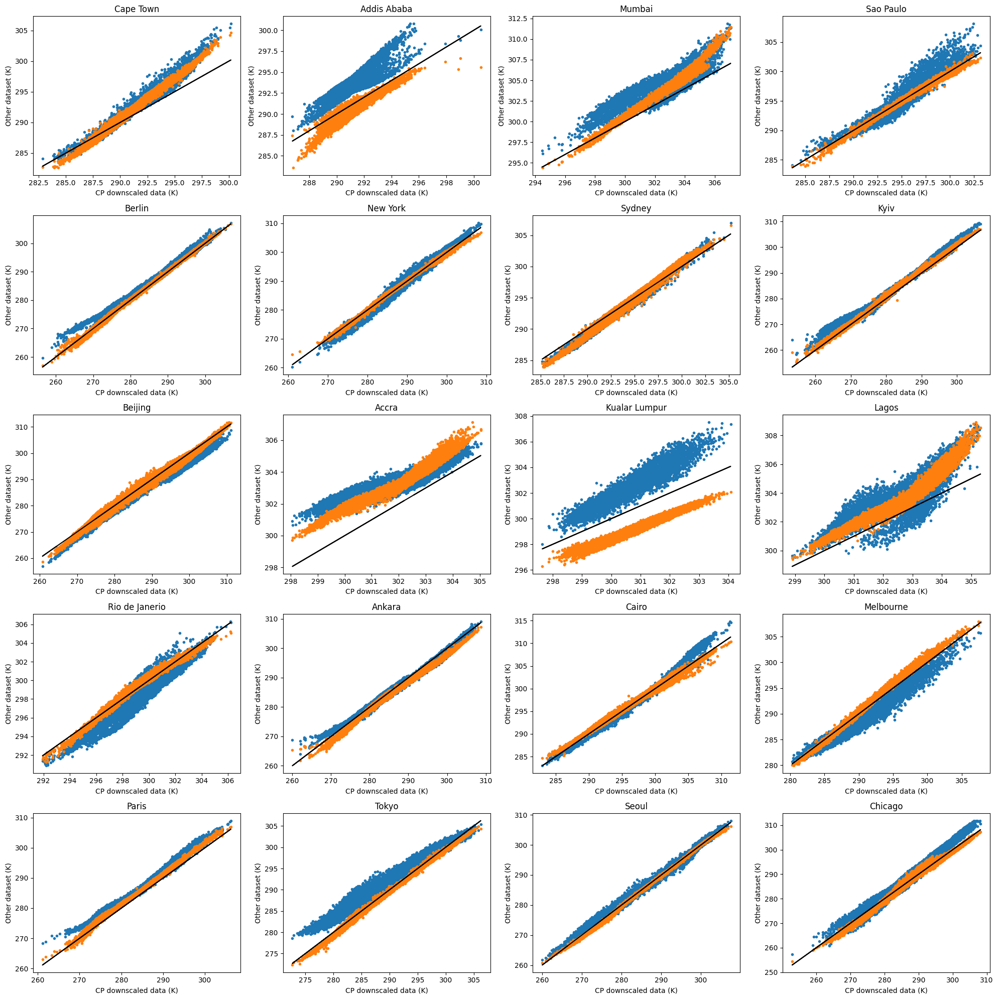

In [77]:
fig, axarr_shape = plt.subplots(nrows=5, ncols=4, figsize=(20, 20))
axarr = axarr_shape.flatten()
for i, (location, (lat, lon)) in enumerate(locations.items()):
    print(i)
    ds1_1pt = ds1_tas_fut['tas'].sel(lat=lat, lon=lon, method="nearest")[:-365].load()
    ds2_1pt = ds2_tas_fut['tas'].sel(lat=lat, lon=lon, method="nearest")
    raw_1pt = raw_fut['tas'].sel(lat=lat, lon=lon, method="nearest")[:-365].load()
    axarr[i].plot(ds1_1pt,
         raw_1pt,'.', label='Raw model output')

    axarr[i].plot(ds1_1pt,
             ds2_1pt, '.',label='NASA NEX')
    
    axarr[i].plot(ds1_1pt,ds1_1pt,'-k', label='1:1 line')
    axarr[i].set_title(location)
    axarr[i].set_ylabel('Other dataset (K)')
    axarr[i].set_xlabel('CP downscaled data (K)')
fig.legend(["Raw", "NASA NEX", "1:1 line"], loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=4)
plt.tight_layout()